# Image denoising in wavelet domain

Philippe Massouf

Diego Torres

In [1]:
import numpy as np
import scipy as sp  
from scipy.fft import fft, fftfreq, fftshift, ifft, fft2, ifft2
from scipy.signal import freqz, periodogram, welch 
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt
import random 
from PIL import Image
import pywt

In [2]:
#We simulate a noisy version of the image with various SNR (0 db, 10 dB and 20 dB), using a Gaussian white noise

# Reading the image
img_pil = Image.open('barbara.jpg').convert("L")  # Convert to grayscale
img = np.array(img_pil)  # Convert PIL Image to NumPy array

def generate_noise(img, snr):
    N= img.shape[0]*img.shape[1]
    noise_var = (np.sum(img**2)/N)* np.exp(-snr / 10)
    noise = np.random.normal(0, np.sqrt(noise_var), img.shape)
    return noise

def add_noise(img, snr):
    return img + generate_noise(img, snr)

def plot_noisy_image(img, snr):

    # Plotting the image and the noisy image
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    # Adding noise to the image
    noisy_img = add_noise(img, snr)
    # Cliping the values to be in range [0, 255]
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    plt.imshow(noisy_img, cmap='gray')
    plt.title('Noisy Image (SNR = ' + str(snr) + ' dB)')
    plt.show()

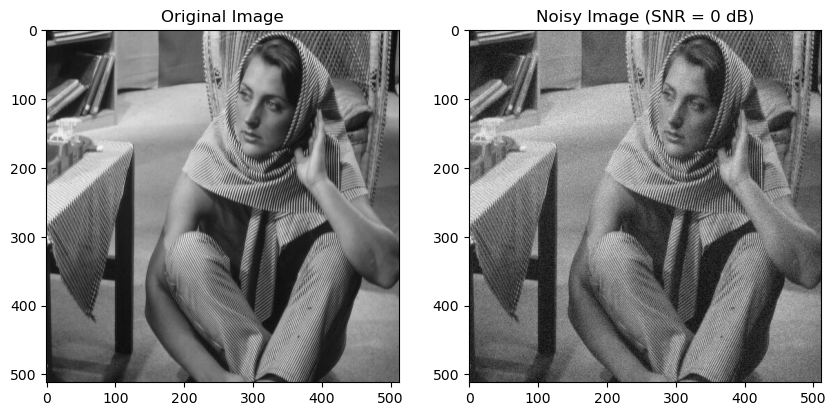

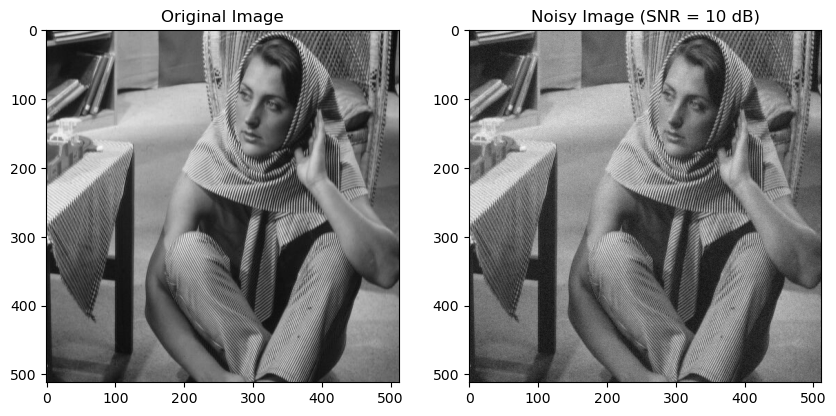

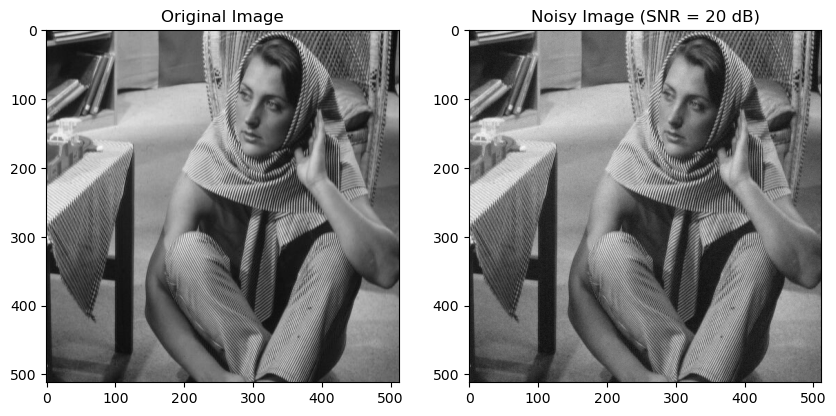

In [3]:
plot_noisy_image(img, 0)
plot_noisy_image(img, 10)
plot_noisy_image(img, 20)

We create a handy function that allows us to perform wavelet denoising with a given wavelet, at a certain level, and controlling the thresholding type. The standard deviation is used as the threshold value each time.

In hard thresholding, the wavelet coefficients below the given threshold are set to 0. Mathematically, it is given by:
- $\textrm{HardThreshold}(x) = x$ if $|x| > T$, $0$ otherwise

On the other hand, soft thresholding tries to shrink the larger values of the coefficients towards zero:
- $\textrm{SoftThreshold}(x) = \textrm{sign}(x) ( ∣x∣ − T ) $ if $|x| > T$, $0$ otherwise


We use two wavelets in our experiments:

- __Haar wavelet__: The simplest and one of the earliest wavelets. It resembles a step function and is computationally efficient. It's often used for simple denoising but it's not very smooth, so it may introduce artifacts. Mathematically:
$$
    \psi(t) = 
    \begin{cases} 
    1 & \text{for } 0 \leq t < 0.5, \\
    -1 & \text{for } 0.5 \leq t < 1, \\
    0 & \text{otherwise}
    \end{cases}
$$

- __Daubechies Wavelet__:  parameterized by the number of vanishing moments, often referred to by 'dbN,' where $N$ is the number of vanishing moments. They offer a good trade-off between computational efficiency and smoothness and are widely used in image and audio compression. Here we use 'db2' and 'db4' as our wavelets from this family.

In [38]:
def denoise_wavelet_adaptive(img, wavelet_type, level, threshold_type, noise_std):
    # Get the wavelet coefficients, it is is a list with the first element being the subsampled image
    # and the rest are the details coefficients (LL, LH, HL, HH) 
    coeffs = pywt.wavedec2(img, wavelet_type, level=level)
    
    thresholded_coeffs = []
    for i, coeff in enumerate(coeffs):
        if i == 0:
            thresholded_coeffs.append(coeff) # keep the subsampled image as it is
        else:
            thresholded_detail = []
            for detail_coefficients in coeff:
                threshold_value = noise_std  # setting threshold based on noise standard deviation
                detail_coefficients = pywt.threshold(detail_coefficients, threshold_value, mode=threshold_type)
                thresholded_detail.append(detail_coefficients)
            thresholded_coeffs.append(tuple(thresholded_detail))
    
    # Reconstruct the image using the thresholded coefficients
    denoised_img = pywt.waverec2(thresholded_coeffs, wavelet_type)
    # Cliping the values to be in range [0, 255]
    denoised_img = np.clip(denoised_img, 0, 255).astype(np.uint8)
    
    return denoised_img

In [78]:
# Update the function to use adaptive thresholding for denoising
def plot_grid_images_adaptive(img, snr, wavelet_types, levels, threshold_type, *, function=denoise_wavelet_adaptive):
    n_wavelets = len(wavelet_types)
    n_levels = len(levels)

    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    noisy_img = img + noise
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    
    fig, axs = plt.subplots(n_levels, n_wavelets, figsize=(n_wavelets*5, n_levels*5))
    
    for j, wavelet_type in enumerate(wavelet_types):
        for i, level in enumerate(levels):
            
            denoised_img = function(noisy_img, wavelet_type, level, threshold_type, noise_std)
            
            axs[i, j].imshow(denoised_img, cmap='gray')
            axs[i, j].set_title(f'{wavelet_type}, level: {level}, type: {threshold_type}')
                
    plt.tight_layout()
    plt.show()

## Experiments

We use a rather low SNR, so that changes are more easily appreciated.

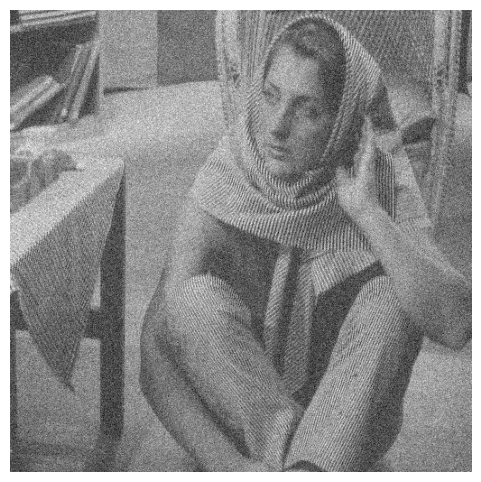

In [40]:
snr = -20  # signal to Noise Ratio in dB

plt.figure(figsize=(6, 6))
plt.imshow(add_noise(img, snr), cmap='gray')
plt.axis('off')
plt.show()

We experiment with both types of wavelets, their levels, and the type of thresholding. We create a nice grid of denoised images to see the interaction between levels and wavelet types

In [41]:
new_wavelet_types = ['haar', 'db2', 'db4']
new_levels = [3, 5, 7]

First we explore the hard thresholding

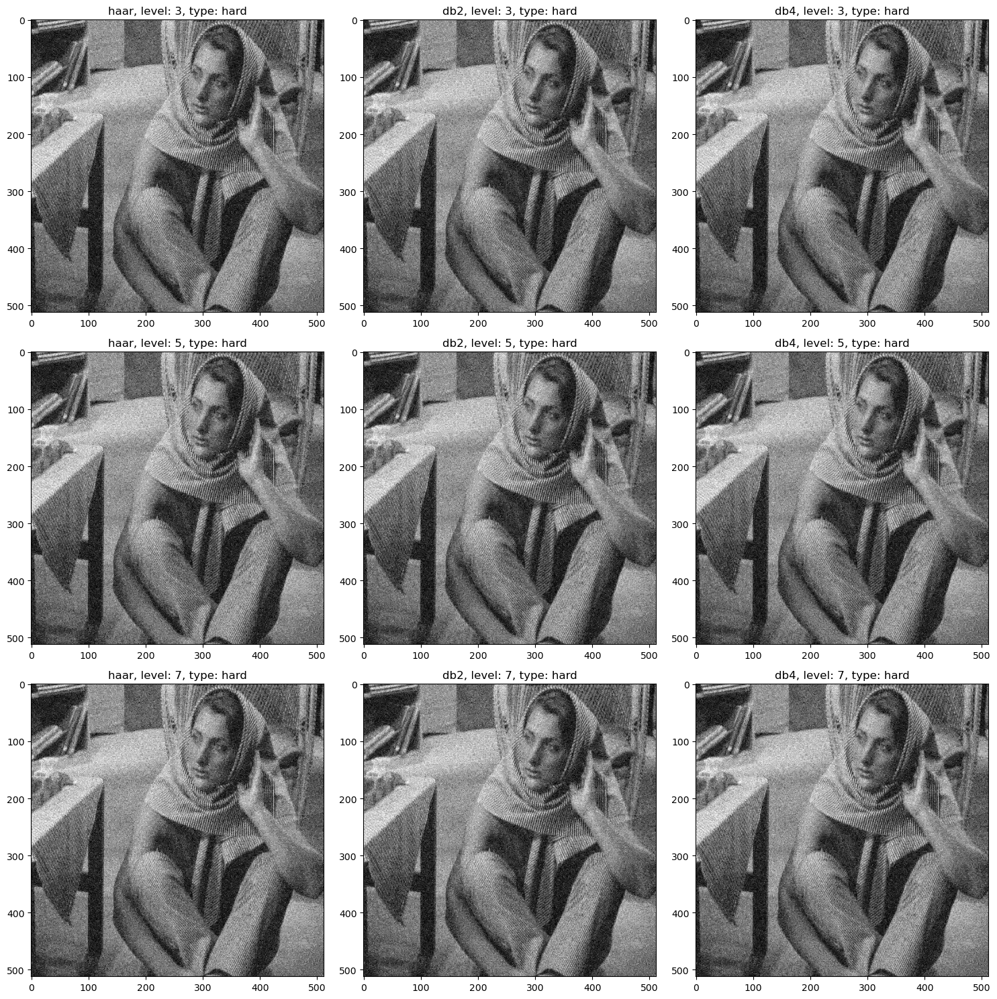

In [45]:
plot_grid_images_adaptive(img, snr, new_wavelet_types, new_levels, 'hard')

The results are not satisfactory, as it seems that no denoising was performed at all.

We then explore soft thresholding

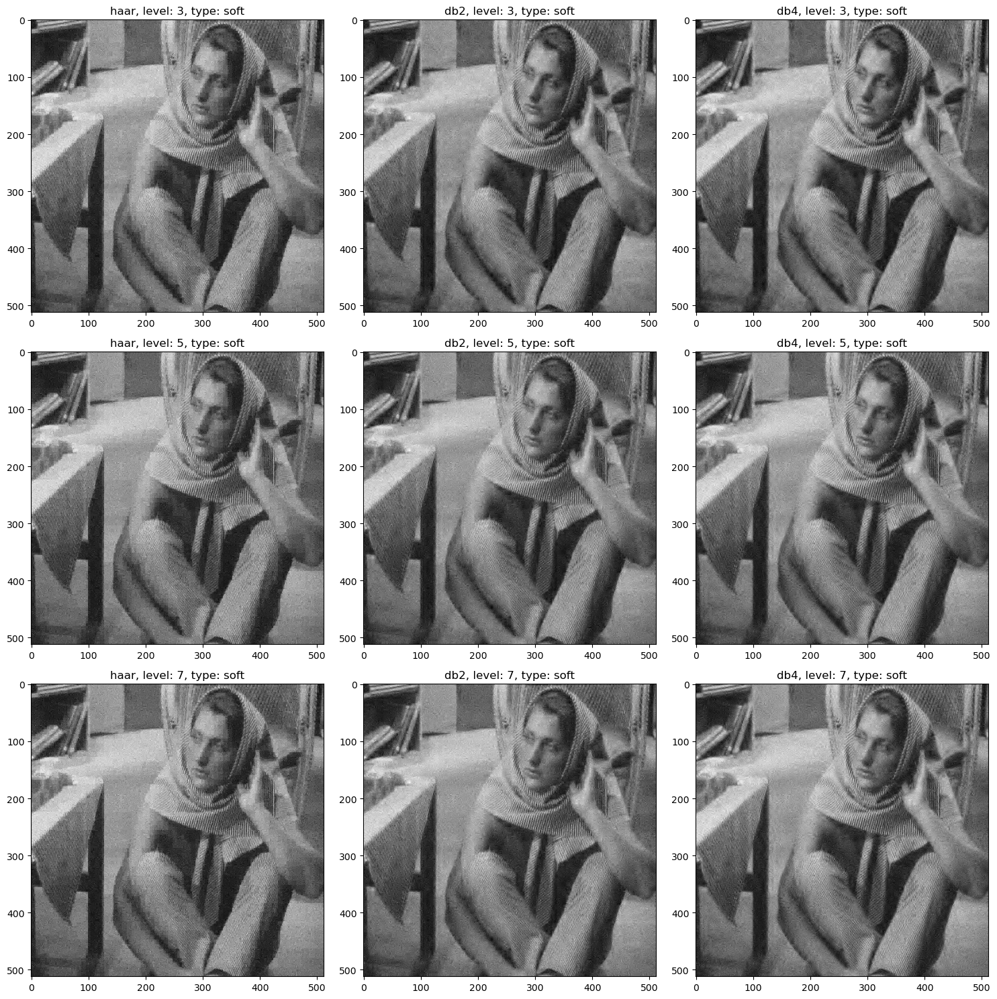

In [43]:
plot_grid_images_adaptive(img, snr, new_wavelet_types, new_levels, 'soft')

These results are much better, and we can see differences between the savelet types and the levels used in the denoising. Qualitatively, it seems that Daubechies tend to preserve more details than Haar, as this last wavelet produces an image with a pixelated effect. Since some of the results are not easily distinguishable by a human, we recurr to the snr of the denoised image to find the set of parameters that yield to the best outcome

In [51]:
def calculate_snr(original, denoised):
    signal_power = np.mean(original ** 2)
    noise_power = np.mean((original - denoised) ** 2)
    if noise_power == 0:
        return float('inf')
    snr_value = 10 * np.log10(signal_power / noise_power)
    return snr_value


# Re-defining the function to generate a table of SNR values for different combinations
# and sort the table by SNR value due to the state reset
def generate_sorted_snr_table(img, snr, wavelet_types, levels, threshold_type):

    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    noisy_img = img + noise
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
        
    table_data = []
    for j, wavelet_type in enumerate(wavelet_types):
        for i, level in enumerate(levels):
            
            denoised_img = denoise_wavelet_adaptive(noisy_img, wavelet_type, level, threshold_type, noise_std)
            snr_value = calculate_snr(img, denoised_img)
            row = [wavelet_type, level, threshold_type, round(snr_value, 2)]
            table_data.append(row)
                
    # Sort table data by SNR value in descending order
    table_data.sort(key=lambda x: x[3], reverse=True)
    
    # Print headers
    headers = ['Wavelet Type', 'Number of Levels', 'Threshold Type', 'SNR (dB)']
    print("{:<15} {:<20} {:<15} {:<10}".format(*headers))
    print("="*60)
    
    # Print sorted rows
    for row in table_data:
        print("{:<15} {:<20} {:<15} {:<10}".format(*row))

In [73]:
# Generate and display the SNR table sorted by SNR values
np.random.seed(10)

snr = -20  # Signal to Noise Ratio in dB
new_wavelet_types = ['haar', 'db2', 'db4']
new_levels = [3, 4, 5, 7]

# Generate and display the SNR table sorted by SNR values
generate_sorted_snr_table(img, snr, new_wavelet_types, new_levels, 'soft')

Wavelet Type    Number of Levels     Threshold Type  SNR (dB)  
db2             3                    soft            1.75      
db2             4                    soft            1.73      
db2             5                    soft            1.72      
db2             7                    soft            1.7       
db4             4                    soft            1.69      
db4             3                    soft            1.68      
db4             5                    soft            1.68      
haar            3                    soft            1.67      
db4             7                    soft            1.67      
haar            4                    soft            1.66      
haar            5                    soft            1.64      
haar            7                    soft            1.62      


In [62]:
# function to plot the evolution of SNR between original and denoised image for an image with 'Haar' wavelet and 'soft' threshold
# for levels varying from 1 to 10
def plot_snr_evolution(img, snr, wavelet_type, threshold_type, max_level):
    levels = list(range(1, max_level + 1))
    snr_values = []
    
    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    
    noisy_img = add_noise(img, snr)
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    
    for level in levels:
        denoised_img = denoise_wavelet_adaptive(noisy_img, wavelet_type, level, threshold_type, noise_std)
        snr_value = calculate_snr(img, denoised_img)
        snr_values.append(snr_value)
    
    # Plot the SNR evolution
    plt.figure(figsize=(10, 6))
    plt.plot(levels, snr_values, marker='o', linestyle='-')
    plt.xlabel('Decomposition Level')
    plt.ylabel('SNR (dB)')
    plt.title(f'Evolution of SNR with {wavelet_type} Wavelet and {threshold_type.capitalize()} Threshold')
    plt.grid(True)
    plt.show()

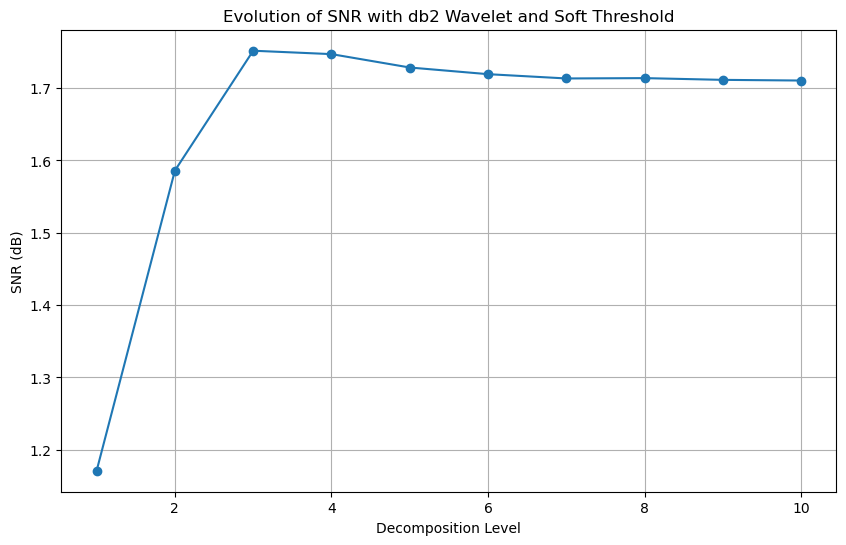

In [75]:
np.random.seed(10)
plot_snr_evolution(img, snr, 'db2', 'soft', 10)

We can see that the best combination of parameters is 'db2' with 3 number of levels, which gives an SNR of 1.75. Coming from an image with -20 of SNR, this is impressive.

# Translation Invariant Wavelet Transform 

Translationinvariant wavelet transform aims to address one of the limitations of the standard wavelet transform: its sensitivity to translations. By averaging over denoised versions of translated images, this function attempts to produce a denoised image that is less sensitive to the initial positioning of features within the image. The averaging step helps to cancel out noise and retain the original features, making the process more robust.

In summary, we implement a form of translation-invariant wavelet denoising by shifting, denoising, unshifting, and finally averaging over the shifts.

In [12]:
from scipy.ndimage import shift

# function to perform translation invariant wavelet denoising using cycle-spinning
def denoise_wavelet_translation_invariant(img, wavelet_type, level, threshold_type, noise_std, num_shifts=4):
    denoised_imgs = np.zeros((num_shifts, *img.shape))
    
    for i in range(num_shifts):
        shift_amount = (i, i)
        img_shifted = np.roll(img, shift_amount, axis=(0, 1))
        denoised_img_shifted = denoise_wavelet_adaptive(img_shifted, wavelet_type, level, threshold_type, noise_std)
        denoised_img = np.roll(denoised_img_shifted, (-shift_amount[0], -shift_amount[1]), axis=(0, 1))
        denoised_imgs[i] = denoised_img
    
    denoised_img_final = np.mean(denoised_imgs, axis=0)
    
    return np.clip(denoised_img_final, 0, 255).astype(np.uint8)

In [56]:
# function to generate a table of SNR values for different combinations and sort the table by SNR value
def generate_sorted_snr_table_ti(img, snr, wavelet_types, levels, threshold_type, num_shifts=4):
    table_data = []
    
    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    
    noisy_img = add_noise(img, snr)
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    
    for wavelet_type in wavelet_types:
        for level in levels:
            denoised_img = denoise_wavelet_translation_invariant(noisy_img, wavelet_type, level, threshold_type, noise_std, num_shifts)
            snr_value = calculate_snr(img, denoised_img)
            row = [wavelet_type, level, threshold_type, round(snr_value, 2)]
            table_data.append(row)
                
    table_data.sort(key=lambda x: x[3], reverse=True)
    
    headers = ['Wavelet Type', 'Number of Levels', 'Threshold Type', 'SNR (dB)']
    print("{:<15} {:<20} {:<15} {:<10}".format(*headers))
    print("="*60)
    
    for row in table_data:
        print("{:<15} {:<20} {:<15} {:<10}".format(*row))


In [58]:
# function to plot the evolution of SNR for translation-invariant wavelet denoising
def plot_snr_evolution_ti(img, snr, wavelet_type, threshold_type, max_level, num_shifts=4):
    levels = list(range(1, max_level + 1))
    snr_values = []
    
    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    
    noisy_img = add_noise(img, snr)
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    
    for level in levels:
        denoised_img = denoise_wavelet_translation_invariant(noisy_img, wavelet_type, level, threshold_type, noise_std, num_shifts)
        snr_value = calculate_snr(img, denoised_img)
        snr_values.append(snr_value)
    
    plt.figure(figsize=(10, 6))
    plt.plot(levels, snr_values, marker='o', linestyle='-')
    plt.xlabel('Decomposition Level')
    plt.ylabel('SNR (dB)')
    plt.title(f'Evolution of SNR with {wavelet_type} Wavelet and {threshold_type.capitalize()} Threshold (Translation Invariant)')
    plt.grid(True)
    plt.show()

/home/diego/miniconda3/envs/hoML1/lib/python3.10/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


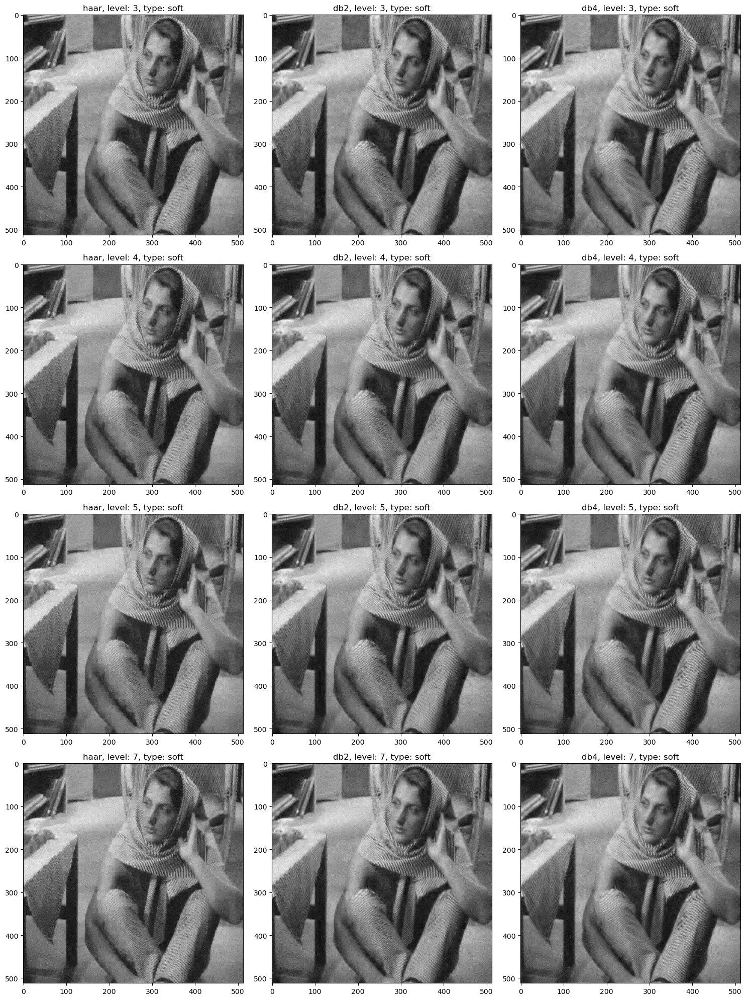

In [79]:
plot_grid_images_adaptive(img, snr, new_wavelet_types, new_levels, 'soft', function=denoise_wavelet_translation_invariant)

Qualitatively we don't find much difference between the original denoising and the one done using the translation invariant wavelet

/home/diego/miniconda3/envs/hoML1/lib/python3.10/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Wavelet Type    Number of Levels     Threshold Type  SNR (dB)  
db2             3                    soft            1.92      
db2             4                    soft            1.91      
db2             5                    soft            1.88      
db2             7                    soft            1.88      
haar            3                    soft            1.84      
db4             3                    soft            1.84      
db4             4                    soft            1.84      
haar            4                    soft            1.82      
db4             5                    soft            1.82      
db4             7                    soft            1.81      
haar            5                    soft            1.79      
haar            7                    soft            1.77      


/home/diego/miniconda3/envs/hoML1/lib/python3.10/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/home/diego/miniconda3/envs/hoML1/lib/python3.10/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/home/diego/miniconda3/envs/hoML1/lib/python3.10/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


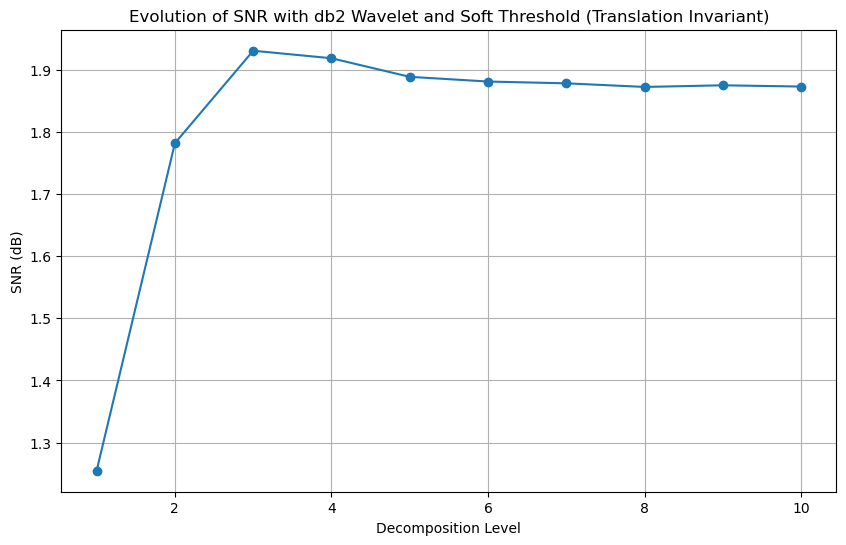

In [76]:
np.random.seed()
generate_sorted_snr_table_ti(img, snr, new_wavelet_types, new_levels, 'soft', num_shifts=4)

plot_snr_evolution_ti(img, snr, 'db2', 'soft', 10, num_shifts=4)

However, by looking at the numerical results, we can see that it provides a considerable improvement in the denoising capabilities of the method.